In [3]:
# Enable autoreload
%load_ext autoreload
%autoreload 2

import json
from data_preparation import prepro_data_gp, prepro_data_pce, prepro_data_kl, preprocess_field_data
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import numpy as np

import openturns as ot
import matplotlib.pyplot as plt
from metamodels import GpMetamodel, VPCEMetamodel, KarhunenLoeveMetamodel, GpMetamodelInd
from plot import plot_tpd
import pickle

BASE_DIRECTORY = '/Users/edgarjaber/Desktop/Articles/codes folder/Bayes-calibration-for-clogging-prognostics/DATA/'
SIMULATION_TIME = np.load(BASE_DIRECTORY + 'simulation_data/LHS/d1/t_gv.npy', allow_pickle=True)

csv_file = BASE_DIRECTORY + 'field_data/field_data.csv'
input_dic = json.load(open(BASE_DIRECTORY + 'meta_data/SG_cleaning_conditioning.json'))
cleaning_dates = [input_dic['chemistry']['cleaning'][i]['time']/24 for i in range(len(input_dic['chemistry']['cleaning']))]

HOURLY_GRID = np.linspace(0, 420481, 420481).astype(int)

### MATPLOTLIB CONFIGURATION ###
plt.rcParams['figure.dpi']= 500
plt.rcParams['text.usetex'] = True

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
data, time_indices = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=True)

# GP metamodel build

In [5]:
TREND = 'Quad'
COV = 'AbsExp'

In [6]:
### DATA ###
lhs_hl = np.load(BASE_DIRECTORY + 'simulation_data/LHS/d1/doe_hl.npy', allow_pickle=True)
lhs_cl = np.load(BASE_DIRECTORY + 'simulation_data/LHS/d1/doe_cl.npy', allow_pickle=True)

mc_hl = np.load(BASE_DIRECTORY + 'simulation_data/MC/d1/doe_hl.npy', allow_pickle=True)
mc_cl = np.load(BASE_DIRECTORY + 'simulation_data/MC/d1/doe_cl.npy', allow_pickle=True)


In [18]:
mc_hl[0].shape

(2,)

## For the LHS DoE

In [12]:
n_max = lhs_hl.shape[0]
n_samp = 1000
input_dimension = 2

In [246]:
X, y, scaler = prepro_data_gp(lhs_hl, lhs_cl, SIMULATION_TIME, n_max, n_samp, input_dimension, scale=True)

In [247]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

In [248]:
GP = GpMetamodel(trend=TREND, kernel=COV, input_dimension=input_dimension)

In [249]:
GP.fit(X_train, y_train)

WRN - (previous message repeated 7 times)
WRN - Warning! For coherency we set scale upper bounds = [6.94659,6.88956]


In [ ]:
X_test.

In [10]:
y_pred = GP.predict(X_test)
print(f'R2 = {r2_score(y_test, y_pred)}')

R2 = 0.9915884013802161


In [11]:
X, y = prepro_data_gp(lhs_hl, lhs_cl, SIMULATION_TIME, n_max, n_samp, input_dimension, scale=False)
_, X_test, _, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

real_test = []
for l in range(X_test.shape[0]):
    rand_test = []
    for q in range(0, len(SIMULATION_TIME)):
         rand_test.append(list(X_test[l, :input_dimension-1]) + [SIMULATION_TIME[q]*24])
    real_test.append(rand_test)
real_test = np.array(real_test)

In [12]:
pred_traj = []
for l in range(X_test.shape[0]):
    scaled_test = scaler.transform(real_test[l,:,:])
    pred_traj.append(GP.predict(scaled_test))

Text(0.5, 0.98, 'LHS-GP, Quad trend, AbsExp kernel')

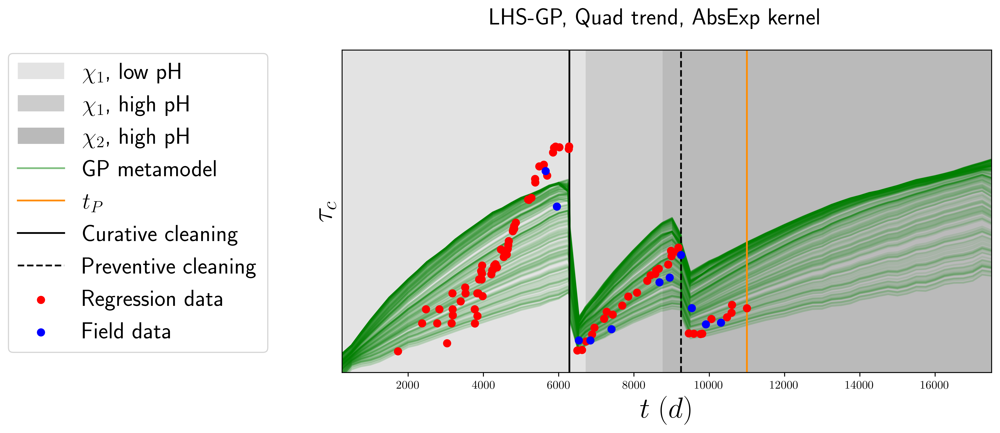

In [13]:
fig, axs = plt.subplots(1,1, figsize=(10,5))

axs = plot_tpd(axs, input_dic, np.asarray(pred_traj), SIMULATION_TIME, 'GP metamodel')
for i in range(3):
    if i == 0:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red', label='Regression data', zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', label='Field data', zorder=10)
    else:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red',  zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', zorder=10)

axs.set_yticks([])
axs.grid(False)

lines_labels = [axs.get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, bbox_to_anchor=(0.05,0.9), fontsize=20)

fig.suptitle(f'LHS-GP, {TREND} trend, {COV} kernel', fontsize=20)

In [14]:
with open(BASE_DIRECTORY + f'metamodels/GP/gp_{TREND}_{COV}_lhs.pkl', 'wb') as f:
    pickle.dump(GP, f) # :D gp.gp

with open(BASE_DIRECTORY + f'metamodels/GP/gp_{TREND}_{COV}_lhs_scaler.pkl', 'wb') as scaler_file:
    pickle.dump(scaler, scaler_file)

## For the MC DoE

In [15]:
X, y, scaler = prepro_data_gp(mc_hl, mc_cl, SIMULATION_TIME, n_max, n_samp, input_dimension, scale=True)

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

In [17]:
GP = GpMetamodel(trend=TREND, kernel=COV, input_dimension=input_dimension)

In [18]:
GP.fit(X_train, y_train)

WRN - Warning! For coherency we set scale upper bounds = [6.86092,6.80553]


In [19]:
y_pred = GP.predict(X_test)
print(f'R2 = {r2_score(y_test, y_pred)}')

R2 = 0.9987270601494765


In [20]:
X, y = prepro_data_gp(lhs_hl, lhs_cl, SIMULATION_TIME, n_max, n_samp, input_dimension, scale=False)
_, X_test, _, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

real_test = []
for l in range(X_test.shape[0]):
    rand_test = []
    for q in range(0, len(SIMULATION_TIME)):
         rand_test.append(list(X_test[l, :input_dimension-1]) + [SIMULATION_TIME[q]*24])
    real_test.append(rand_test)
real_test = np.array(real_test)

In [21]:
pred_traj = []
for l in range(X_test.shape[0]):
    scaled_test = scaler.transform(real_test[l,:,:])
    pred_traj.append(GP.predict(scaled_test))

Text(0.5, 0.98, 'MC-GP, Quad trend, AbsExp kernel')

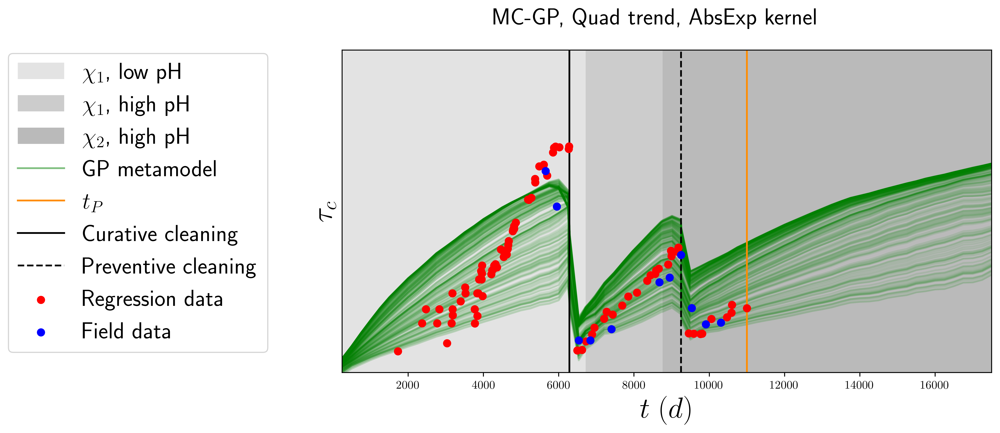

In [22]:
fig, axs = plt.subplots(1,1, figsize=(10,5))

axs = plot_tpd(axs, input_dic, np.asarray(pred_traj), SIMULATION_TIME, 'GP metamodel')
for i in range(3):
    if i == 0:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red', label='Regression data', zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', label='Field data', zorder=10)
    else:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red',  zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', zorder=10)

axs.set_yticks([])
axs.grid(False)

lines_labels = [axs.get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, bbox_to_anchor=(0.05,0.9), fontsize=20)

fig.suptitle(f'MC-GP, {TREND} trend, {COV} kernel', fontsize=20)

In [23]:
with open(BASE_DIRECTORY + f'metamodels/GP/gp_{TREND}_{COV}_mc.pkl', 'wb') as f:
    pickle.dump(GP, f) # :D gp.gp

with open(BASE_DIRECTORY + f'metamodels/GP/gp_{TREND}_{COV}_mc_scaler.pkl', 'wb') as scaler_file:
    pickle.dump(scaler, scaler_file)

# PCE metamodel

In [10]:
data, time_indices = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=False)

distribution = ot.Uniform(0, 15e-4)
prior_distribution_list = [distribution]

input_dimension = 1
DEGREE=5
QNORM = 0.7
 

## For the LHS DoE

In [13]:
X, y = prepro_data_pce(lhs_hl, lhs_cl, n_max, n_samp, 2)

0 nan trajectories in output sample


In [26]:
y_interpolated = np.asarray([np.interp(data[:,0]*24, SIMULATION_TIME*24, y[i,:]) for i in range(len(y))])

In [27]:
X_train, X_test, y_train_int, y_test_int = train_test_split(X, y_interpolated, train_size=0.75, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

In [28]:
PCE_calibration = VPCEMetamodel(degree=DEGREE, q_norm=QNORM, input_dimension=input_dimension, prior_distribution_list=[ot.Uniform(0.0, 15e-4)])
PCE_full = VPCEMetamodel(degree=DEGREE, q_norm=QNORM, input_dimension=input_dimension, prior_distribution_list=[ot.Uniform(0.0, 15e-4)])

In [29]:
PCE_calibration.fit(X_train, y_train_int)
PCE_full.fit(X_train, y_train)

Running Polynomial Chaos Expansion with regression method for degree 5, q-norm 0.7
Running Polynomial Chaos Expansion with regression method for degree 5, q-norm 0.7


WRN - set the component 58 of contributor 3=0 to zero as it is too small
WRN - set the component 4 of contributor 4=0 to zero as it is too small
WRN - set the component 62 of contributor 4=0 to zero as it is too small
WRN - set the component 79 of contributor 4=0 to zero as it is too small
WRN - set the component 80 of contributor 4=0 to zero as it is too small
WRN - set the component 48 of contributor 5=0 to zero as it is too small
WRN - set the component 89 of contributor 5=0 to zero as it is too small
WRN - set the component 25 of contributor 3=0 to zero as it is too small
WRN - set the component 28 of contributor 4=0 to zero as it is too small
WRN - set the component 72 of contributor 4=0 to zero as it is too small
WRN - set the component 73 of contributor 4=0 to zero as it is too small
WRN - set the component 74 of contributor 4=0 to zero as it is too small
WRN - set the component 21 of contributor 5=0 to zero as it is too small
WRN - set the component 42 of contributor 5=0 to zer

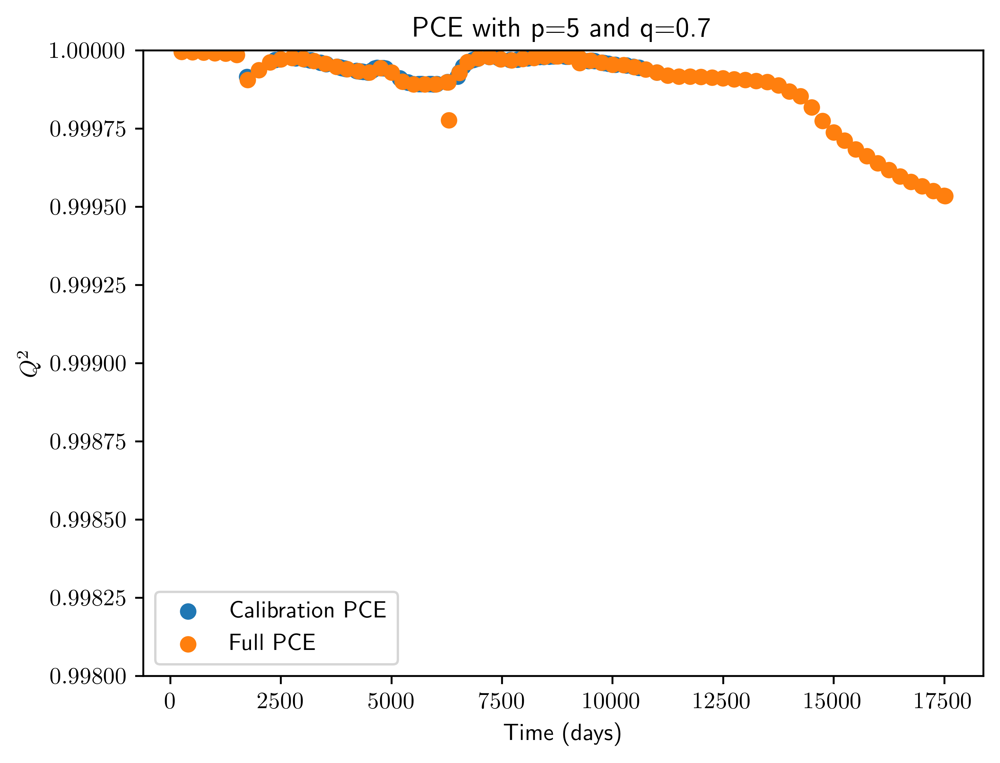

In [30]:
plt.scatter(data[:,0], PCE_calibration.r2_score(X_test, y_test_int, data[:, 0]), label='Calibration PCE')
plt.scatter(SIMULATION_TIME, PCE_full.r2_score(X_test, y_test, SIMULATION_TIME), label='Full PCE')
plt.ylim(0.998, 1)
plt.xlabel('Time (days)')
plt.ylabel(r'$Q^2$')
plt.title(f'PCE with p={DEGREE} and q={QNORM}')
plt.legend()

In [31]:
test_traj_calibration = PCE_calibration.predict(X_test)
test_traj_full = PCE_full.predict(X_test)

Text(0.5, 0.98, 'MC-PCE with p=5 and q=0.7')

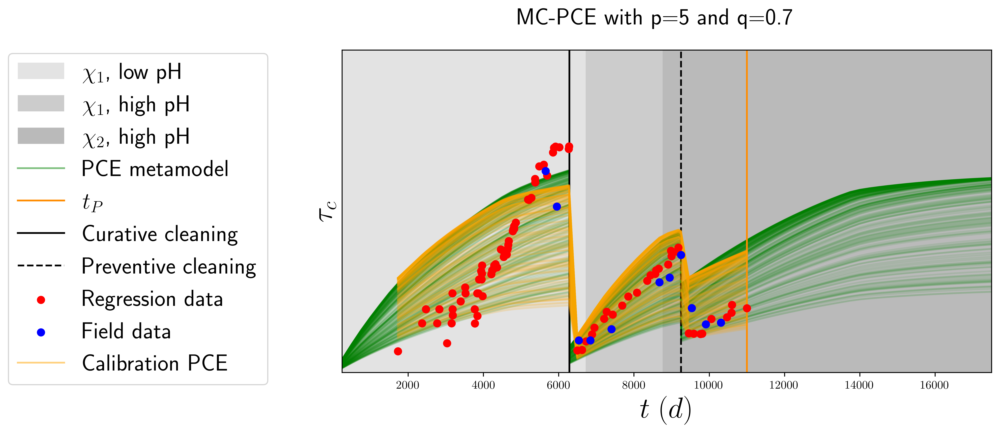

In [43]:
data, time_indices = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=True)

fig, axs = plt.subplots(1,1, figsize=(10,5))

axs = plot_tpd(axs, input_dic, np.asarray(test_traj_full), SIMULATION_TIME, 'PCE metamodel')
for i in range(3):
    if i == 0:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red', label='Regression data', zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', label='Field data', zorder=10)
    else:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red',  zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', zorder=10)

data, _ = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=False)

for i in range(250):
    axs.plot(data[:,0], test_traj_calibration[i], color='orange', alpha=0.1)
    if i == 0:
        plt.plot(data[:,0], test_traj_calibration[i], color='orange', alpha=0.5, label='Calibration PCE')

axs.set_yticks([])
axs.grid(False)

lines_labels = [axs.get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, bbox_to_anchor=(0.05,0.9), fontsize=20)

fig.suptitle(f'MC-PCE with p={DEGREE} and q={QNORM}', fontsize=20)

In [44]:
with open(BASE_DIRECTORY + f'metamodels/PCE/PCE_cal_{DEGREE}_0{str(QNORM)[2]}_mc.pkl', 'wb') as f:
    pickle.dump(PCE_calibration, f) 

with open(BASE_DIRECTORY + f'metamodels/PCE/PCE_full_{DEGREE}_0{str(QNORM)[2]}_mc.pkl', 'wb') as f:
    pickle.dump(PCE_full, f)

# Karhunen-Loeve-based metamodel

In [110]:
data, time_indices = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=False)

input_dimension = 1

In [111]:
X, y, scaler = prepro_data_kl(lhs_hl, lhs_cl, n_max, n_samp, 2, scale=True)

0 nan trajectories in output sample


In [112]:
y_interpolated = np.asarray([np.interp(data[:,0]*24, SIMULATION_TIME*24, y[i,:]) for i in range(len(y))])

In [113]:
X_train, X_test, y_train_int, y_test_int = train_test_split(X, y_interpolated, train_size=0.75, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

In [149]:
#GP KLE
TREND, COV = 'Linear', 'AbsExp'
GP = GpMetamodel(trend=TREND, kernel=COV, input_dimension=input_dimension)
KL_calibration = KarhunenLoeveMetamodel(metamodel=GP, input_dimension=input_dimension, simulation_time=data[:,0]*24)
KL_full = KarhunenLoeveMetamodel(metamodel=GP, input_dimension=input_dimension, simulation_time=SIMULATION_TIME*24)


In [134]:
#PCE KLE
deg, q_norm = 2, 0.5
PCE = VPCEMetamodel(degree=deg, q_norm=q_norm, input_dimension=input_dimension, prior_distribution_list=[ot.Uniform(0.0, 15e-4)])
KL_calibration = KarhunenLoeveMetamodel(metamodel=PCE, input_dimension=input_dimension, simulation_time=data[:,0]*24)
KL_full = KarhunenLoeveMetamodel(metamodel=PCE, input_dimension=input_dimension, simulation_time=SIMULATION_TIME*24)

In [150]:
KL_calibration.fit(X_train, y_train_int)
KL_full.fit(X_train, y_train)

Running Karhunen-Loeve decomposition
Explained variance for 1 modes is 0.9999862015633829
Done fitting mode 1
Running Karhunen-Loeve decomposition
Explained variance for 2 modes is 0.9999995788127323
Done fitting mode 1


WRN - Warning! For coherency we set scale upper bounds = [6.94659]


Done fitting mode 2


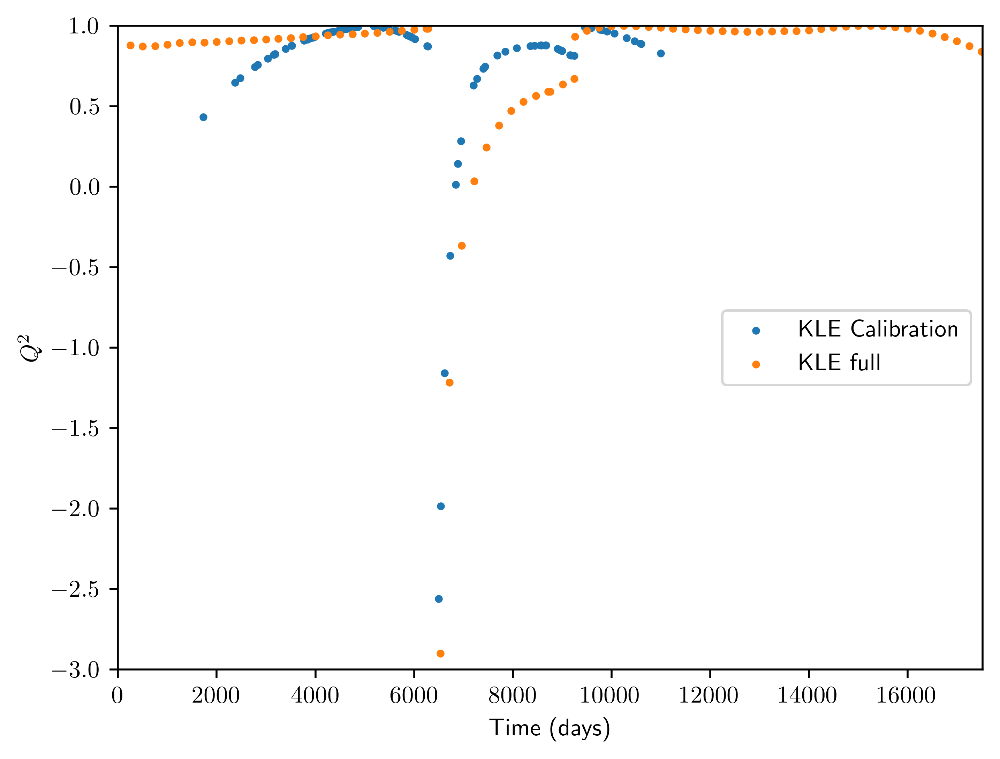

In [151]:
plt.scatter(data[:,0], KL_calibration.r2_score(X_test, y_test_int, data[:, 0]), s=5, label='KLE Calibration')
plt.scatter(SIMULATION_TIME, KL_full.r2_score(X_test, y_test, SIMULATION_TIME), s=5, label='KLE full')
plt.xlabel('Time (days)')
plt.ylabel(r'$Q^2$')
plt.xlim(0, max(SIMULATION_TIME))
plt.ylim(-3, 1)
plt.legend(loc='right')

In [152]:
test_traj_calibration = KL_calibration.predict(X_test)
test_traj_full = KL_full.predict(X_test)

Text(0.5, 0.98, 'KL-GP, modes fitted with GP(Linear,AbsExp)')

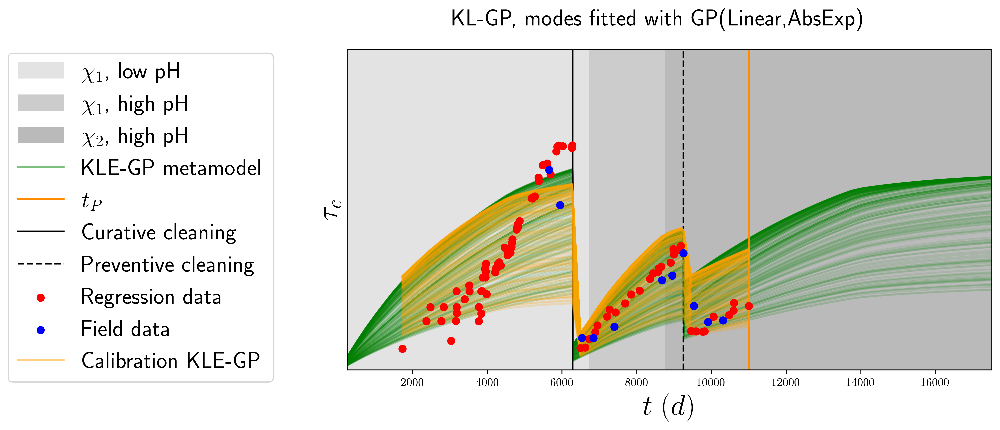

In [153]:

data, time_indices = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=True)

fig, axs = plt.subplots(1,1, figsize=(10,5))

axs = plot_tpd(axs, input_dic, np.asarray(test_traj_full), SIMULATION_TIME, 'KLE-GP metamodel')
for i in range(3):
    if i == 0:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red', label='Regression data', zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', label='Field data', zorder=10)
    else:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red',  zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', zorder=10)

data, _ = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=False)

for i in range(250):
    axs.plot(data[:,0], test_traj_calibration[i], color='orange', alpha=0.1)
    if i == 0:
        plt.plot(data[:,0], test_traj_calibration[i], color='orange', alpha=0.5, label='Calibration KLE-GP')

axs.set_yticks([])
axs.grid(False)

lines_labels = [axs.get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, bbox_to_anchor=(0.05,0.9), fontsize=20)

fig.suptitle(f'KL-GP, modes fitted with GP({TREND},{COV})', fontsize=20)


In [54]:
with open(BASE_DIRECTORY + f'metamodels/KL/KL_cal_{TREND}_mc.pkl', 'wb') as f:
    pickle.dump(KL_calibration, f) 

with open(BASE_DIRECTORY + f'metamodels/KL/KL_full_{TREND}_mc.pkl', 'wb') as f:
    pickle.dump(KL_full, f)

with open(BASE_DIRECTORY + f'metamodels/KL/KL_scaler.pkl', 'wb') as scaler_file:
    pickle.dump(scaler, scaler_file)

## Dimension 8

In [250]:
### DATA ###
lhs_hl = np.load(BASE_DIRECTORY + 'simulation_data/LHS/d8/doe_hl.npy', allow_pickle=True)
lhs_cl = np.load(BASE_DIRECTORY + 'simulation_data/LHS/d8/doe_cl.npy', allow_pickle=True)

mc_hl = np.load(BASE_DIRECTORY + 'simulation_data/MC/d8/doe_hl.npy', allow_pickle=True)
mc_cl = np.load(BASE_DIRECTORY + 'simulation_data/MC/d8/doe_cl.npy', allow_pickle=True)


In [251]:
data, time_indices = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=False)


n_max = lhs_hl.shape[0]
n_samp = 1000
input_dimension = 8

In [252]:
X, y, scaler = prepro_data_kl(mc_hl, mc_cl, n_max, n_samp, input_dimension, scale=True)

11 nan trajectories in output sample


In [253]:
y_interpolated = np.asarray([np.interp(data[:,0]*24, SIMULATION_TIME*24, y[i,:]) for i in range(len(y))])

In [256]:
X_train, X_test, y_train_int, y_test_int = train_test_split(X, y_interpolated, train_size=0.75, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

In [ ]:
X, y, scaler = prepro_data_gp(mc_hl, mc_cl, SIMULATION_TIME, n_max, n_samp, input_dimension, scale=True)

In [260]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, random_state=42)

In [277]:
GP = GpMetamodelInd(trend=TREND, kernel=COV, input_dimension=input_dimension, index=0)
GP.fit(X_train, y_train)

In [278]:
GP.predict(X_test[:, 0])

[[ 6.79542995e-01 -1.50051490e-02  2.42872665e-04 ...  2.68926138e-02
  -1.99278827e-02  1.04071107e-02]
 [ 9.05546669e-01 -1.50051490e-02  2.42872665e-04 ...  2.68926138e-02
  -1.99278827e-02  1.04071107e-02]
 [-2.74362459e-01 -1.50051490e-02  2.42872665e-04 ...  2.68926138e-02
  -1.99278827e-02  1.04071107e-02]
 ...
 [ 1.48196101e+00 -1.50051490e-02  2.42872665e-04 ...  2.68926138e-02
  -1.99278827e-02  1.04071107e-02]
 [-6.11155061e-01 -1.50051490e-02  2.42872665e-04 ...  2.68926138e-02
  -1.99278827e-02  1.04071107e-02]
 [-4.62287517e-01 -1.50051490e-02  2.42872665e-04 ...  2.68926138e-02
  -1.99278827e-02  1.04071107e-02]]


array([[34.55921026],
       [34.76874829],
       [34.13046795],
       [35.89453376],
       [34.36837691],
       [34.76818987],
       [34.56575328],
       [35.36248218],
       [34.37210948],
       [34.85388812],
       [34.70561391],
       [34.75972598],
       [34.70119215],
       [34.77786338],
       [34.82139888],
       [34.1902792 ],
       [34.56615916],
       [35.79115521],
       [34.11304443],
       [34.80267261],
       [34.44991557],
       [34.77669001],
       [34.18466216],
       [34.23359237],
       [34.31077399],
       [34.50536609],
       [34.27083286],
       [34.1492029 ],
       [34.35306172],
       [34.75311221],
       [35.359561  ],
       [34.79850763],
       [34.45136368],
       [34.1906896 ],
       [34.37301079],
       [34.05754516],
       [34.11615652],
       [34.19555566],
       [34.89615306],
       [34.04863059],
       [35.18552379],
       [34.40852313],
       [34.89769245],
       [34.21692077],
       [34.22370648],
       [34

In [237]:
#GP KLE
TREND, COV = 'Quad', 'AbsExp'
GP = GpMetamodel(trend=TREND, kernel=COV, input_dimension=(input_dimension-1))
KL_calibration = KarhunenLoeveMetamodel(metamodel=GP, input_dimension=input_dimension, simulation_time=data[:,0]*24)
KL_full = KarhunenLoeveMetamodel(metamodel=GP, input_dimension=input_dimension, simulation_time=SIMULATION_TIME*24)


In [238]:
KL_calibration.fit(X_train, y_train_int)
KL_full.fit(X_train, y_train)

Running Karhunen-Loeve decomposition
Explained variance for 1 modes is 0.9999881404682656
Done fitting mode 1
Running Karhunen-Loeve decomposition
Explained variance for 2 modes is 0.9999981577624959
Done fitting mode 1
Done fitting mode 2


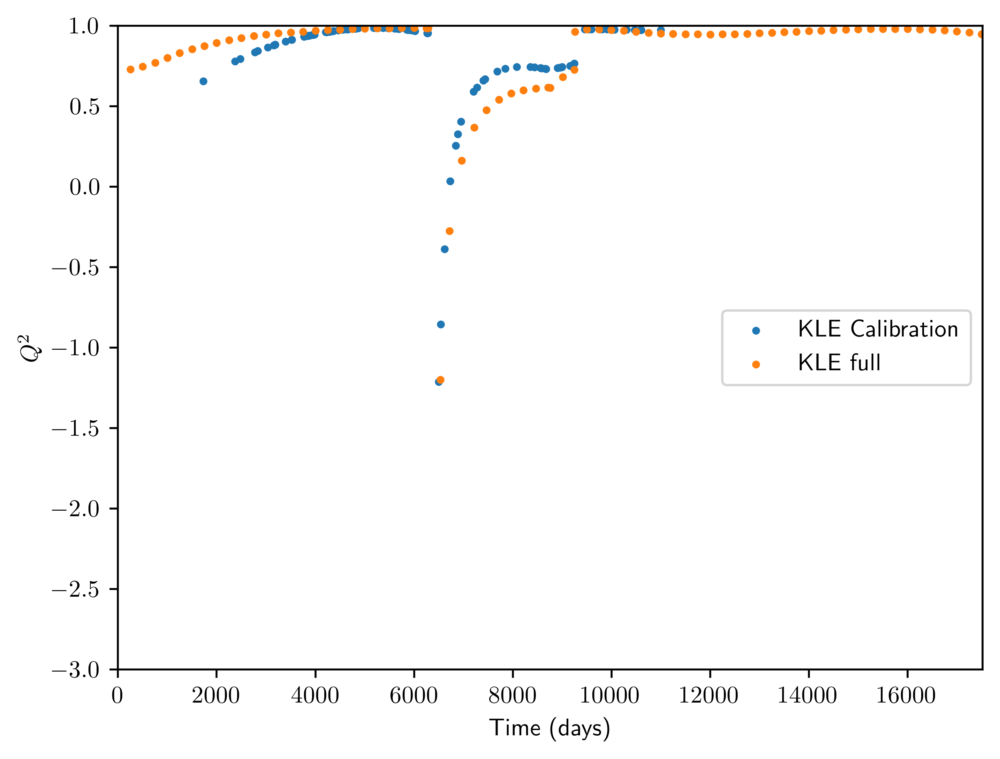

In [239]:
plt.scatter(data[:,0], KL_calibration.r2_score(X_test, y_test_int, data[:, 0]), s=5, label='KLE Calibration')
plt.scatter(SIMULATION_TIME, KL_full.r2_score(X_test, y_test, SIMULATION_TIME), s=5, label='KLE full')
plt.xlabel('Time (days)')
plt.ylabel(r'$Q^2$')
plt.xlim(0, max(SIMULATION_TIME))
plt.ylim(-3, 1)
plt.legend(loc='right')

Text(0.5, 0.98, 'KL-GP, modes fitted with GP(Quad,AbsExp)')

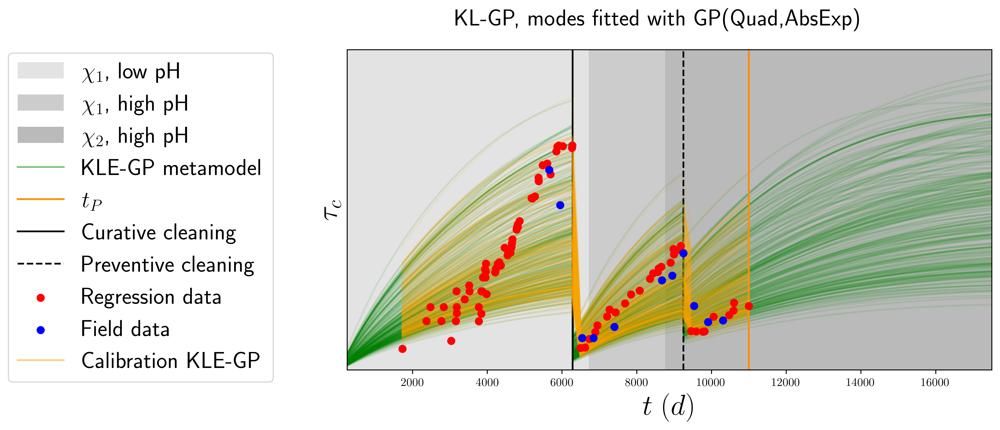

In [240]:
test_traj_calibration = KL_calibration.predict(X_test)
test_traj_full = KL_full.predict(X_test)

data, time_indices = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=True)

fig, axs = plt.subplots(1,1, figsize=(10,5))

axs = plot_tpd(axs, input_dic, np.asarray(test_traj_full), SIMULATION_TIME, 'KLE-GP metamodel')
for i in range(3):
    if i == 0:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red', label='Regression data', zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', label='Field data', zorder=10)
    else:
        axs.scatter(data[i][0][:, 0], data[i][0][:, 1], color='red',  zorder=10)
        axs.scatter(data[i][1][:, 0], data[i][1][:, 1], color='blue', zorder=10)

data, _ = preprocess_field_data(csv_file=csv_file, 
                                           operation_time=SIMULATION_TIME, 
                                           cleaning_dates=cleaning_dates, 
                                           with_time_division=False)

for i in range(250):
    axs.plot(data[:,0], test_traj_calibration[i], color='orange', alpha=0.1)
    if i == 0:
        plt.plot(data[:,0], test_traj_calibration[i], color='orange', alpha=0.5, label='Calibration KLE-GP')

axs.set_yticks([])
axs.grid(False)

lines_labels = [axs.get_legend_handles_labels()]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, bbox_to_anchor=(0.05,0.9), fontsize=20)

fig.suptitle(f'KL-GP, modes fitted with GP({TREND},{COV})', fontsize=20)
